<a href="https://colab.research.google.com/github/HuyKhoi-code/fruits/blob/master/edge_with_no_cluster_valid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

## Lấy dataframe từ google drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
train = pd.read_csv('/content/drive/My Drive/Fruit recognition/output_input/20_canny_features_train.csv')
test = pd.read_csv('/content/drive/My Drive/Fruit recognition/output_input/20_canny_features_test.csv')

In [4]:
train.head

<bound method NDFrame.head of         name  sec1_mean   sec1_std  ...  sec24_std  sec25_mean  sec25_std
0     cachua   4.303125  32.844786  ...  36.775242    1.115625  16.829728
1     cachua   4.621875  34.017883  ...  23.748479   12.750000  55.575962
2     cachua   5.737500  37.817239  ...  34.017883   14.981250  59.964831
3     cachua   7.650000  43.499741  ...  52.862552   13.228125  56.552529
4     cachua  13.546875  57.192091  ...  67.421276    9.084375  47.265101
...      ...        ...        ...  ...        ...         ...        ...
1995    xoai   8.128125  44.795150  ...  87.647411   37.453125  90.265222
1996    xoai   6.056250  38.828670  ...  63.975912   32.193750  84.693381
1997    xoai  10.200000  49.969591  ...  63.975912   25.978125  77.133384
1998    xoai  15.459375  60.853499  ...  84.513694   20.081250  68.683784
1999    xoai  11.793750  53.556640  ...  73.656601   18.168750  65.596706

[2000 rows x 51 columns]>

In [5]:
test.head

<bound method NDFrame.head of        name  sec1_mean   sec1_std  ...  sec24_std  sec25_mean  sec25_std
0    cachua  14.662500  59.362855  ...  80.379213   25.500000  76.500000
1    cachua   7.171875  42.159131  ...  46.863839   15.459375  60.853499
2    cachua  11.156250  52.157280  ...  39.811862   18.009375  65.330338
3    cachua   9.881250  49.214628  ...  77.551128   36.975000  89.785714
4    cachua   3.825000  30.995877  ...  38.828670   21.993750  71.586879
..      ...        ...        ...  ...        ...         ...        ...
495    xoai  17.212500  63.975912  ...  68.433888   21.515625  70.877093
496    xoai   7.331250  42.611284  ...  70.156868   36.656250  89.463194
497    xoai   7.650000  43.499741  ...  80.379213   33.468750  86.106759
498    xoai   4.303125  32.844786  ...  73.204149   25.500000  76.500000
499    xoai  14.184375  58.445009  ...  83.051198   24.862500  75.642538

[500 rows x 51 columns]>

In [7]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score

In [8]:
label_train = train['name']
features_train = train.drop(['name'], axis = 1)
label_test = test['name']
features_test = test.drop(['name'], axis = 1)

In [9]:
models = []
models.append(('rfc', RandomForestClassifier()))
models.append(('svc', SVC()))
models.append(('knn', KNeighborsClassifier()))


for name, model in models:
  print(name)
  model.fit(features_train, label_train)
  pred = model.predict(features_test)
  print('\ttest', accuracy_score(label_test, pred))

rfc
	test 0.762
svc
	test 0.79
knn
	test 0.708


In [23]:
svc = SVC()
svc.fit (features_train, label_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [30]:
def Canny(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (3,3), 0)
    edge = cv2.Canny(blur, 70 ,50)
    return edge

In [11]:
def features_grid(img):
    features = np.array([], dtype='uint8')
    section = 1
    
    for y in range(0, img.shape[0], 40):
        for x in range(0, img.shape[1], 40):
            
            # Cropping the image into a section.
            section_img = img[y:y+40, x:x+40]
            
            # Claculating the mean and stdev of the sectioned image.
            section_mean = np.mean(section_img)
            section_std = np.std(section_img)
            
            # Appending the above calculated values into features array.
            features = np.append(features, [section_mean, section_std])
    
    # Returning the features array.
    return features

In [31]:
def create_df_with_one_image2(img):
  feature_name = []
  section = 1
  for y in range(0, 200, 40):
      for x in range(0, 200, 40):
          feature_name.append(f"sec{section}_mean")
          feature_name.append(f"sec{section}_std")
          section += 1
  
  all_imgs = np.zeros((1, 50), dtype='uint8')

  name = []
  section_mean = []
  section_std = []

  img = Canny(img)

  img_features = features_grid(img)
  img_features = img_features.reshape(1, img_features.shape[0])

  all_imgs = np.append(all_imgs, img_features, axis=0)
  all_imgs = all_imgs[1:]

  df = pd.DataFrame(all_imgs, columns= feature_name)
  return df

tao


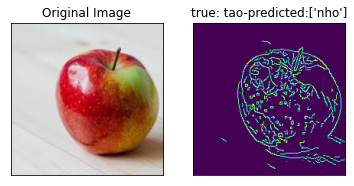

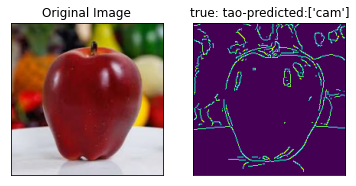

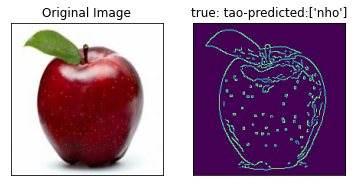

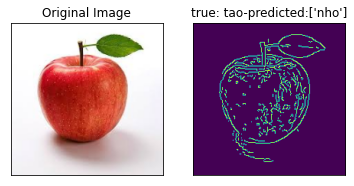

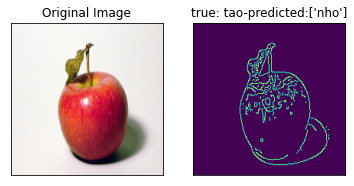

...

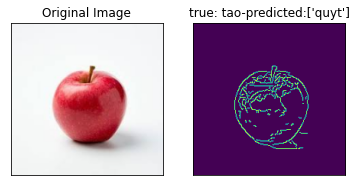

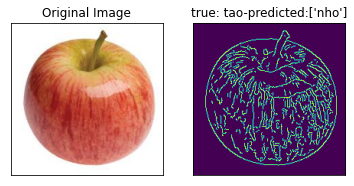

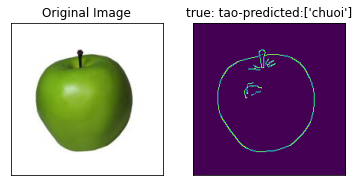

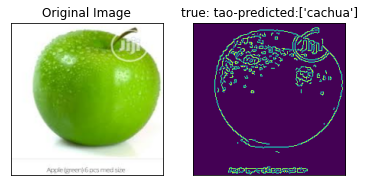

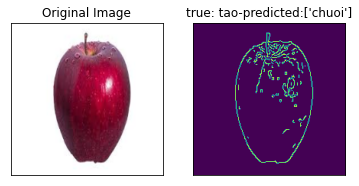

21/21 wrong
nho


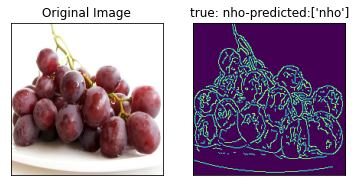

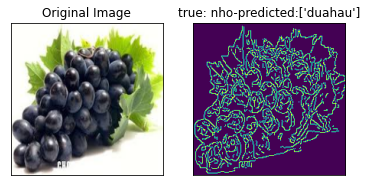

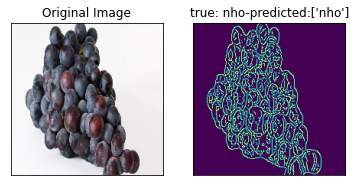

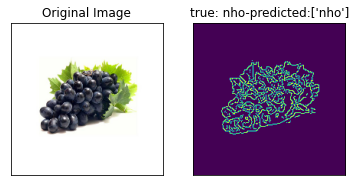

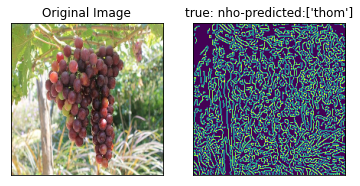

...

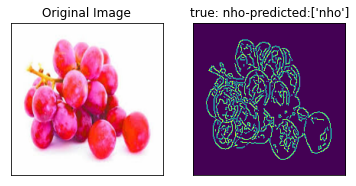

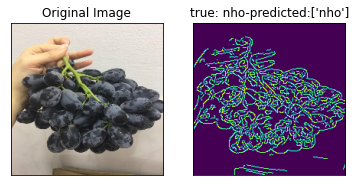

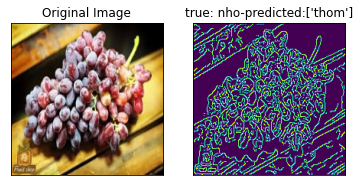

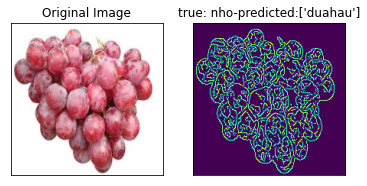

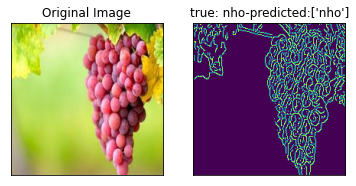

13/21 wrong
quyt


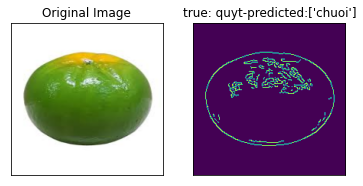

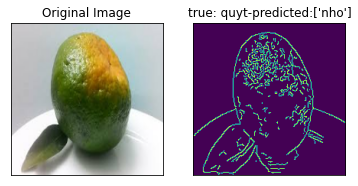

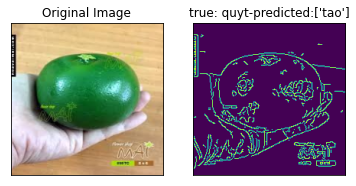

3/3 wrong
xoai


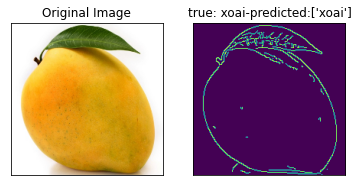

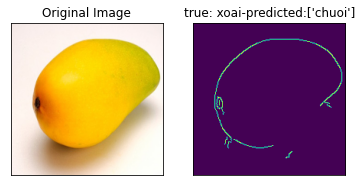

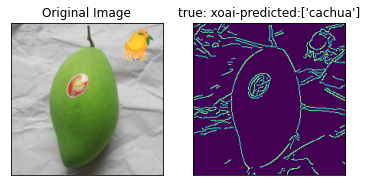

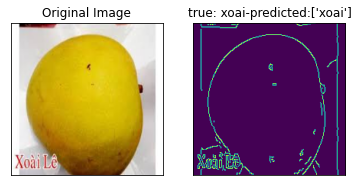

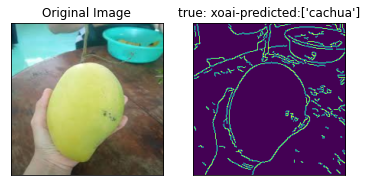

...

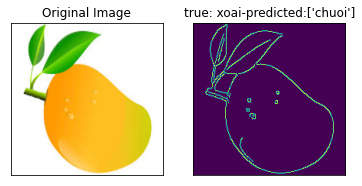

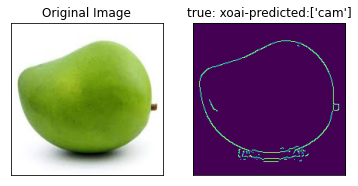

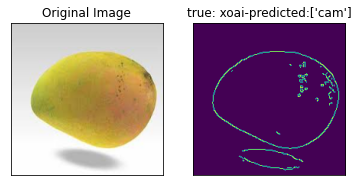

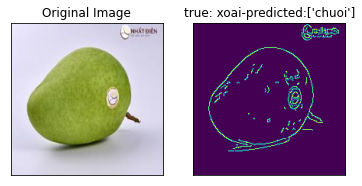

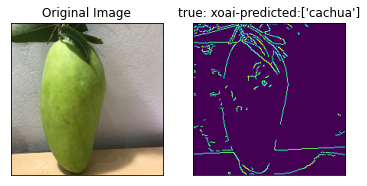

18/21 wrong
thom


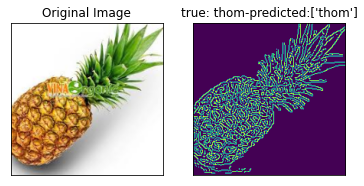

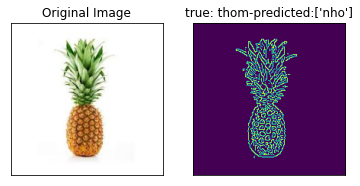

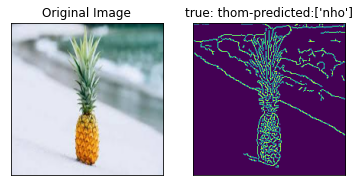

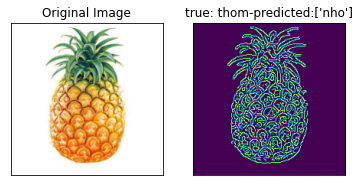

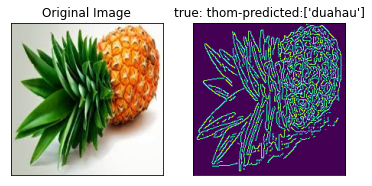

...

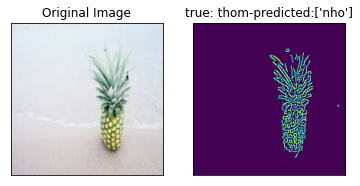

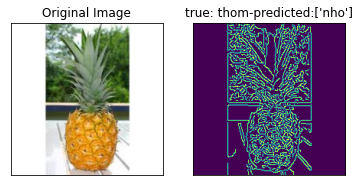

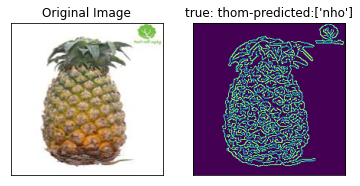

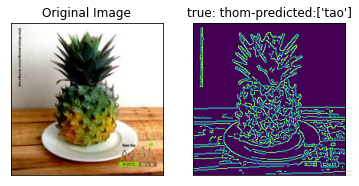

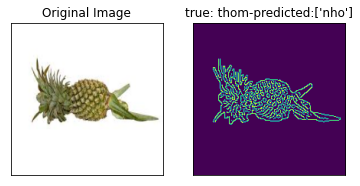

17/21 wrong
ca chua


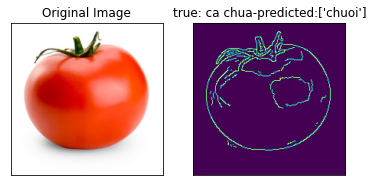

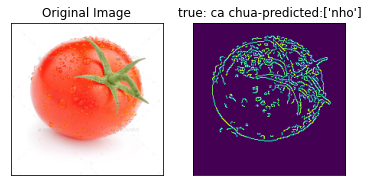

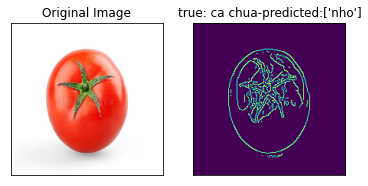

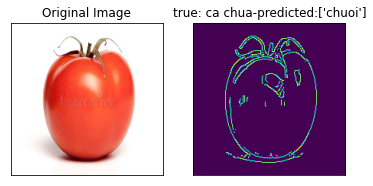

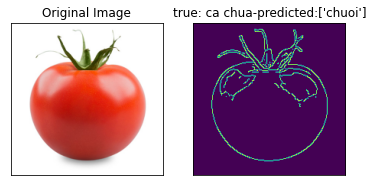

...

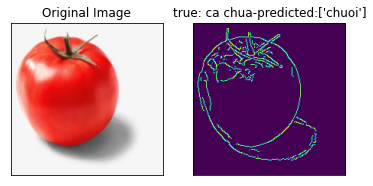

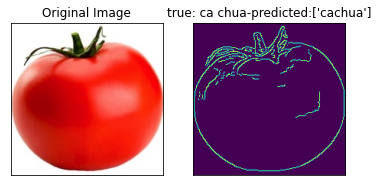

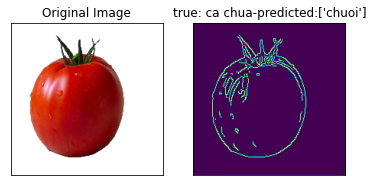

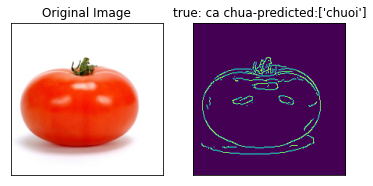

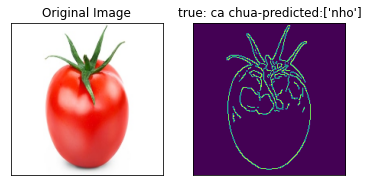

20/20 wrong
cam


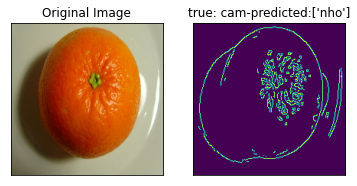

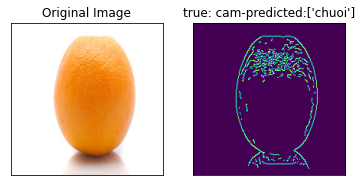

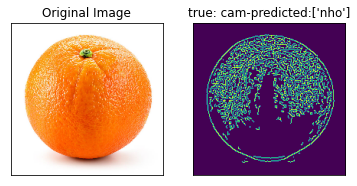

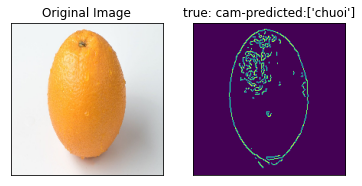

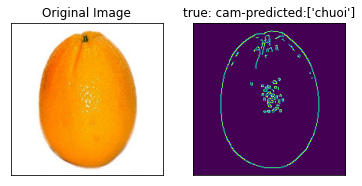

...

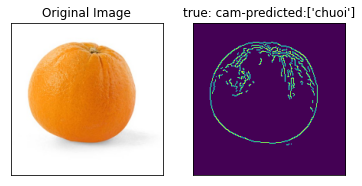

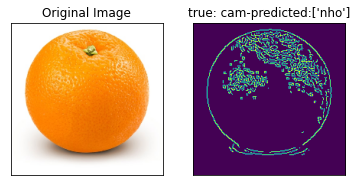

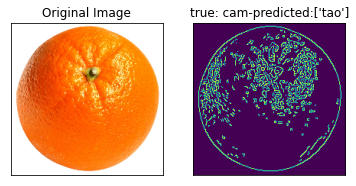

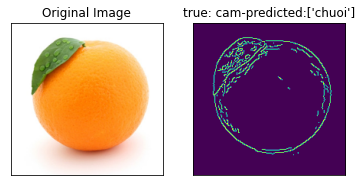

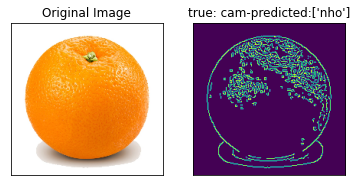

18/19 wrong
chuoi


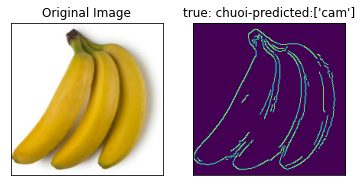

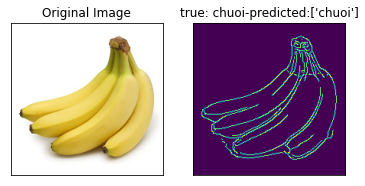

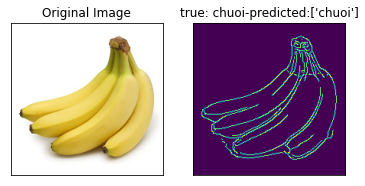

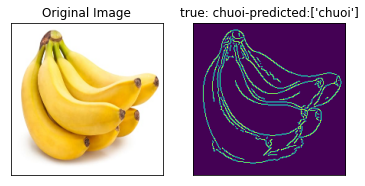

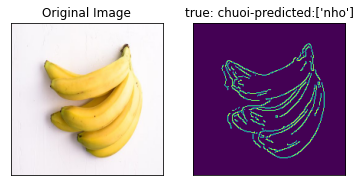

...

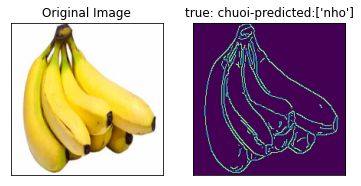

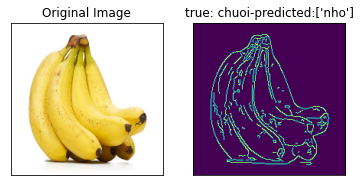

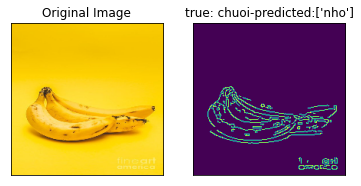

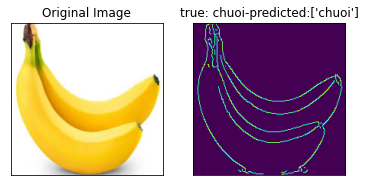

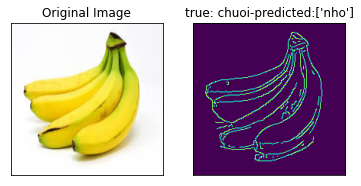

13/22 wrong
dua hau


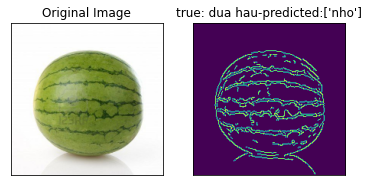

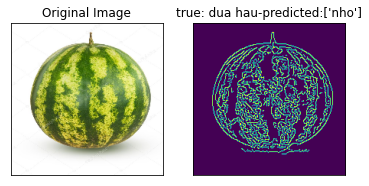

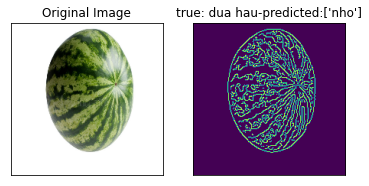

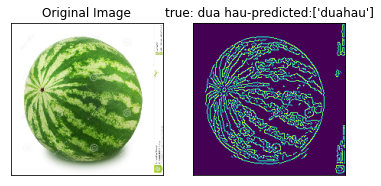

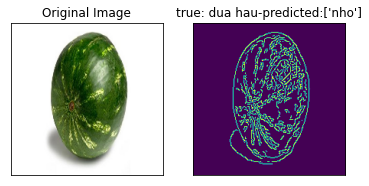

...

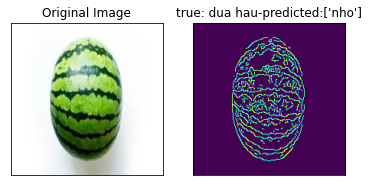

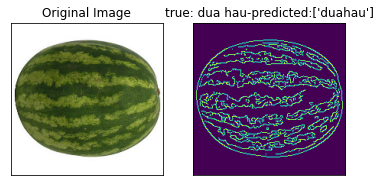

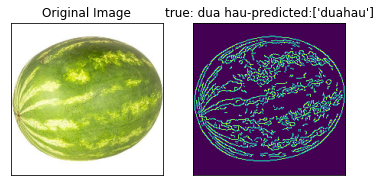

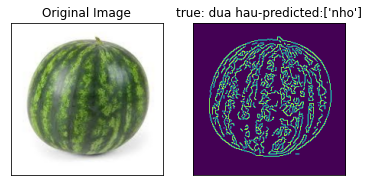

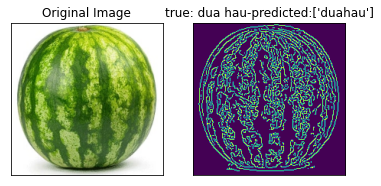

19/19 wrong
le


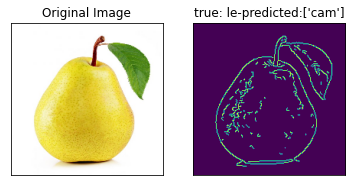

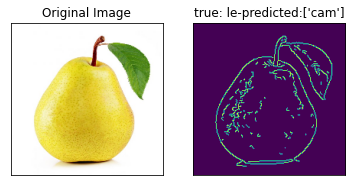

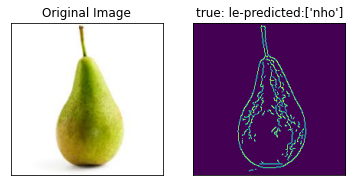

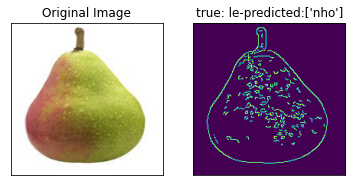

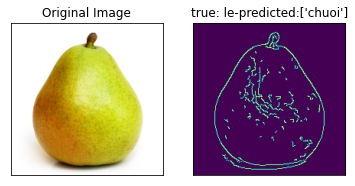

...

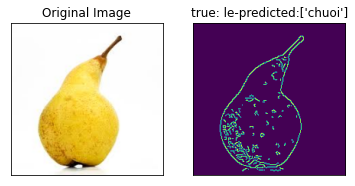

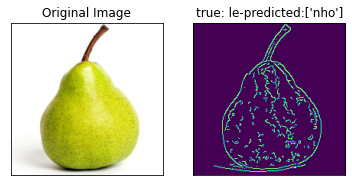

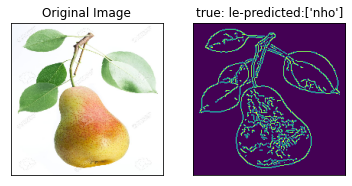

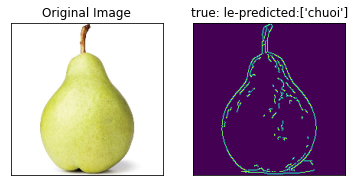

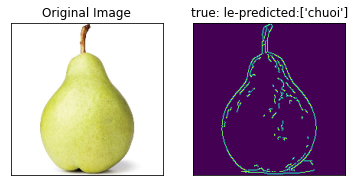

21/21 wrong


In [34]:
path = '/content/drive/My Drive/Fruit recognition/valid data '
file_name = os.listdir(path)
for name in file_name:
  total = 0
  wrong = 0
  print(name)
  for image in os.listdir(path+'/'+name):
    #print(path+'/'+name+'/'+image)
    img = cv2.imread(path+'/'+name+'/'+image)
    resized_img = cv2.resize(img, (200, 200))
    resized_img = cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    final_df = create_df_with_one_image2(resized_img)

    predicted_label = svc.predict(final_df)
    if predicted_label != name:
      wrong+=1
    total+=1

    figure_size = 6
    plt.figure(figsize=(figure_size,figure_size))

    plt.subplot(1,2,1)
    plt.imshow(resized_img)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(1,2,2)
    plt.imshow(Canny(resized_img))
    plt.title('true: {}-predicted:{}'.format(name, predicted_label)), plt.xticks([]), plt.yticks([])

    plt.show()
  print('{}/{} wrong'.format(wrong, total))

## có thể thấy do data train với background bị nhiễu khiến cho model dự đoán không chính xác nếu model gặp phải data chưa từng gặp. Nếu chỉ xử lý đơn giản bằng canny edge thì không thể phân loại được